In [21]:
from simple_copy_paste.coco import CocoDetectionCP
from instance_copy_paste.dataset import COCO_DETECTION
from instance_copy_paste.copy_paste import InstanceCopyPaste
from instance_copy_paste.copy_paste import InstanceRetriever
from instance_copy_paste.dataset import SynData
import os
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as patches
import albumentations as A
import albumentations.pytorch as AT
from simple_copy_paste.simple_copy_paste import CopyPaste
from torchvision.datasets import CocoDetection
from torchvision import transforms, datasets
from torchvision.transforms import v2

In [22]:
train_transform = A.Compose(
    [
        A.RandomScale(
            scale_limit=(-0.9, 1), p=1
        ),  # LargeScaleJitter from scale of 0.1 to 2
        A.PadIfNeeded(
            512, 512, border_mode=0
        ),  # pads with image in the center, not the top left like the paper
        A.RandomCrop(512, 512, p=1),
    ],
    bbox_params=A.BboxParams(
        format="coco", min_visibility=0.05, label_fields=["labels"]
    ),
)

train_transform2 = A.Compose(
    [
        A.RandomScale(scale_limit=(-0.9, 1), p=1),
        A.PadIfNeeded(512, 512, border_mode=0),
        A.Resize(512, 512),
        CopyPaste(blend=True, sigma=1, pct_objects_paste=0.5, p=1),
        AT.ToTensorV2(),
    ],
    bbox_params=A.BboxParams(format="coco"),
)

val_transform = A.Compose(
    [
        # A.RandomScale(scale_limit=(-0.9, 1), p=1),
        A.PadIfNeeded(512, 512, border_mode=0),
        A.Resize(512, 512),
        CopyPaste(blend=True, sigma=1, pct_objects_paste=0.5, p=0),
        AT.ToTensorV2(),
    ],
    bbox_params=A.BboxParams(format="coco"),
)

In [23]:
train = False

root_dir = "data/val2017/"
ann_file = "car_boat_bus_val.json"

syn_dataset = SynData("data-llm", {"car": 2, "bus": 1, "boat": 3})
instance_retriever = InstanceRetriever(syn_dataset)
dataset_cp = CocoDetectionCP(
    root=root_dir, annFile=ann_file, transforms=train_transform2
)

dataset_dcp = COCO_DETECTION(
    "data/val2017/",
    "car_boat_bus_val.json",
    categories=["boat", "car", "bus"],
    transform=train_transform,
    instance_copy_paste=InstanceCopyPaste(instance_retriever, "random", 8, 0.5, 0),
)

data_plain = CocoDetectionCP(root=root_dir, annFile=ann_file, transforms=val_transform)

2630
loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


/var/folders/6l/_d0k81l969n6zvw6fgpq650w0000gn/T/ipykernel_12087/641829360.py:70: MatplotlibDeprecationWarning: The tostring_rgb function was deprecated in Matplotlib 3.8 and will be removed two minor releases later. Use buffer_rgba instead.
  img_arr = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)


torch.Size([3, 480, 640])
torch.Size([3, 480, 640])
torch.Size([3, 480, 640])
torch.Size([3, 480, 640])
torch.Size([3, 480, 640])
torch.Size([3, 480, 640])
torch.Size([3, 480, 640])
torch.Size([3, 480, 640])
torch.Size([3, 480, 640])
torch.Size([3, 480, 640])
torch.Size([3, 480, 640])
torch.Size([3, 480, 640])


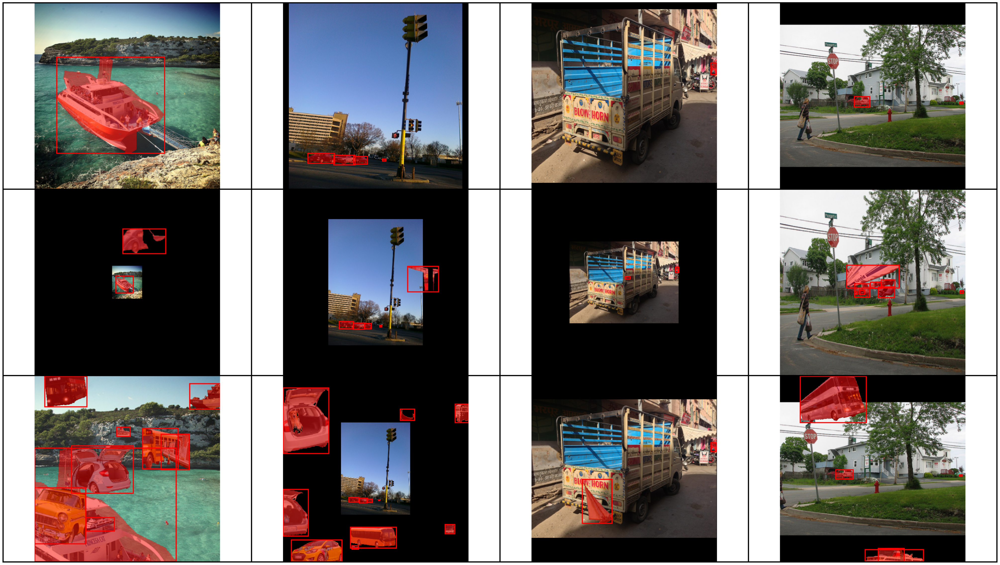

In [24]:
import torch
import torchvision
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
import torchvision
import matplotlib.patches as patches


def tensor_to_image(tensor):
    """Convert tensor to an image format."""
    return np.clip(tensor.numpy().transpose(1, 2, 0), 0, 1)


def plot_images_grid(all_images, ncols=3):
    """Plot a grid of images."""
    # Flatten list of lists of images into a single list
    images = [img for sublist in all_images for img in sublist]
    for im in images:
        print(im.shape)
    # Reduce padding between the images
    grid_img = make_grid(images, nrow=ncols, padding=3)
    # Calculate dynamic figure size (you might need to tweak these values)
    plt.figure(figsize=(40, 40))
    plt.imshow(tensor_to_image(grid_img))
    plt.axis("off")
    plt.tight_layout(pad=0)  # Minimize surrounding whitespace
    plt.savefig("plot.png", bbox_inches="tight")
    plt.show()


def add_boxes_and_masks_to_image(ax, target):
    """Add bounding boxes and masks to an image array."""
    for box in target.get("boxes", []):
        x, y, x1, y1 = box
        w, h = x1 - x, y1 - y
        rect = patches.Rectangle(
            (x, y), w, h, linewidth=2, edgecolor="red", facecolor="none"
        )
        ax.add_patch(rect)
    for mask in target.get("masks", []):
        colored_mask = np.zeros((*mask.shape, 4))
        colored_mask[mask == 1] = np.array([1, 0, 0, 0.5])
        ax.imshow(colored_mask)


def collect_images(datasets, indices):
    """Collect modified images from datasets for indices specified."""
    all_images = []
    for dataset in datasets:
        dataset_images = []
        for idx in indices:
            fig, ax = plt.subplots()
            # Remove padding and margin around the image
            ax.axis("off")
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_position([0, 0, 1, 1])

            img, target = dataset[idx]
            img_np = tensor_to_image(img.detach())  # Assuming img is already a tensor
            ax.imshow(img_np)

            add_boxes_and_masks_to_image(ax, target)

            # Draw the figure canvas
            fig.canvas.draw()

            # Extract the image as an RGB array that exactly fits the ax without white space
            img_arr = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
            img_arr = img_arr.reshape(fig.canvas.get_width_height()[::-1] + (3,))

            img_tensor = (
                torch.from_numpy(img_arr).permute(2, 0, 1) / 255.0
            )  # Convert to tensor
            dataset_images.append(img_tensor)
            plt.close(fig)
        all_images.append(dataset_images)
    return all_images


# Prepare datasets and titles
datasets = [data_plain, dataset_cp, dataset_dcp]
indices = np.random.randint(0, len(data_plain), 4)

# Collect images with bounding boxes and masks
collected_images = collect_images(datasets, indices)

# Plot all images in a single grid
plot_images_grid(collected_images, ncols=4)  # 3 columns, one for each dataset

# Save the plot without whitespace

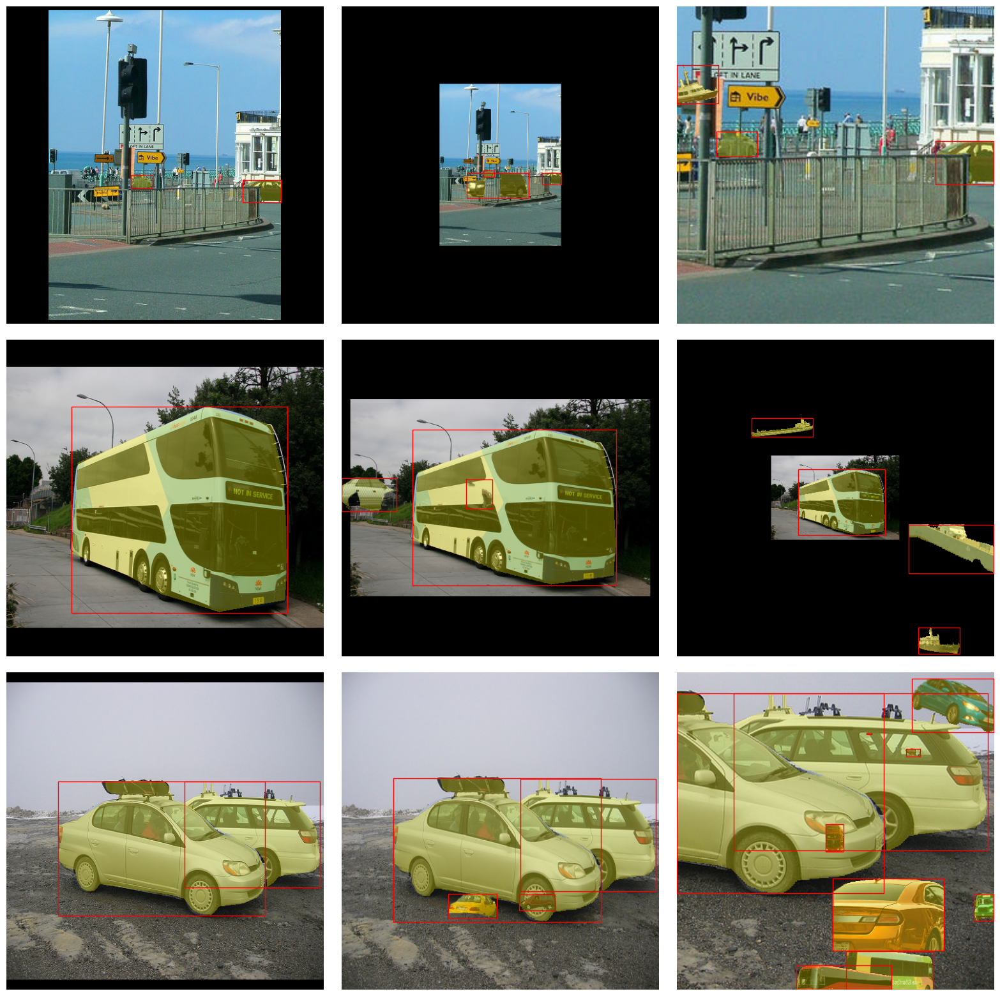

In [65]:
import numpy as np
import matplotlib.patches as patches

fig, axs = plt.subplots(3, 3, figsize=(20, 20))  # 4x3 grid

datasets = [data_plain, dataset_cp, dataset_dcp]

for col, dataset in enumerate(datasets):
    for row in range(3):  # Get four images from each dataset
        img, target = dataset[row + 102]  # Adjust index to fetch different images
        np_img = (
            img.detach().numpy().transpose(1, 2, 0)
        )  # Convert to numpy array in HxWxC format

        axs[row, col].imshow(np_img)  # Display the image

        if "masks" in target:
            for mask in target.get("masks", []):
                colored_mask = np.zeros((*mask.shape, 4))
                colored_mask[mask == 1] = np.array([1, 0.984, 0, 0.3])
                axs[row, col].imshow(colored_mask)

        if "boxes" in target:
            for box in target["boxes"]:
                # Create a Rectangle patch
                x, y, x1, y1 = box
                w, h = x1 - x, y1 - y
                rect = patches.Rectangle(
                    (x, y), w, h, linewidth=1, edgecolor="r", facecolor="none"
                )
                axs[row, col].add_patch(rect)  # Add the patch to the Axes

        axs[row, col].axis("off")  # Hide axes

plt.subplots_adjust(wspace=0.05, hspace=0.05)  # Minimize whitespace between plots<
plt.show()